<a href="https://colab.research.google.com/github/JSJeong-me/Stable_Diffusion/blob/main/Unprompted_Control.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Unprompted Control

Stable Diffusion ControlNet의 원리를 활용하여 간단한 해킹을 통해 옛날 사진을 복원하고 물체를 지우는(Inpainting) 모델

- Stable Diffusion 2.1 Inpainting
- ControlNet Canny
- [Scratch Detection](https://github.com/microsoft/Bringing-Old-Photos-Back-to-Life)

https://github.com/vijishmadhavan/UnpromptedControl

![](https://raw.githubusercontent.com/vijishmadhavan/UnpromptedControl/master/examples/eg2gif.gif)

![](https://github.com/vijishmadhavan/UnpromptedControl/raw/master/examples/objgif.gif)

In [ ]:
#@title Install requirements

!git clone https://github.com/vijishmadhavan/UnpromptedControl
%cd UnpromptedControl
!pip install -q gradio
!pip install -q diffusers==0.14.0 xformers transformers scipy ftfy accelerate controlnet_aux
!pip install -q opencv-contrib-python
!wget -q https://www.dropbox.com/s/5jencqq4h59fbtb/FT_Epoch_latest.pt

Cloning into 'UnpromptedControl'...
remote: Enumerating objects: 183, done.
remote: Counting objects: 100% (183/183), done.
remote: Compressing objects: 100% (160/160), done.
remote: Total 183 (delta 86), reused 78 (delta 18), pack-reused 0
Receiving objects: 100% (183/183), 5.55 MiB | 18.44 MiB/s, done.
Resolving deltas: 100% (86/86), done.
/content/UnpromptedControl
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 67.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 65.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.1/288.1 kB 30.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.4/75.4 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━

In [ ]:
#@title Load Models

import gradio as gr
import numpy as np
import torch
from src.pipeline_stable_diffusion_controlnet_inpaint import *
from scratch_detection import ScratchDetection, process_images
from diffusers import StableDiffusionInpaintPipeline, ControlNetModel, DEISMultistepScheduler
from diffusers.utils import load_image
from PIL import Image
import cv2
import time
import os

device = "cuda"

controlnet = ControlNetModel.from_pretrained("thepowefuldeez/sd21-controlnet-canny", torch_dtype=torch.float16)

pipe = StableDiffusionControlNetInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting", controlnet=controlnet, torch_dtype=torch.float16
)

pipe.scheduler = DEISMultistepScheduler.from_config(pipe.scheduler.config)

# speed up diffusion process with faster scheduler and memory optimization
# remove following line if xformers is not installed
pipe.enable_xformers_memory_efficient_attention()
pipe.to('cuda')

print("Models loaded successfully!")

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Models loaded successfully!


# Image

In [ ]:
!wget -q https://github.com/microsoft/Bringing-Old-Photos-Back-to-Life/blob/master/test_images/old_w_scratch/a.png?raw=true -O /content/test.png

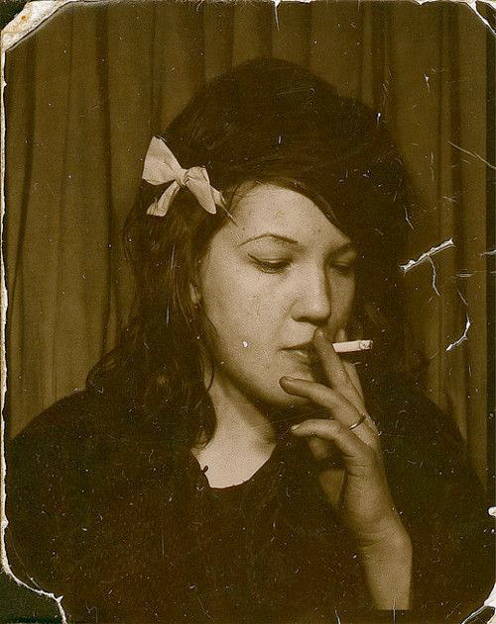

In [ ]:
img = Image.open("/content/test.png").convert("RGB")

img

## Detect scratches from the image

initializing the dataloader
model weights loaded
directory of testing image: /content
processing .config
Skipping non-file .config
processing UnpromptedControl
Skipping non-file UnpromptedControl
processing mask
Skipping non-file mask
processing sample_data
Skipping non-file sample_data
processing test.png


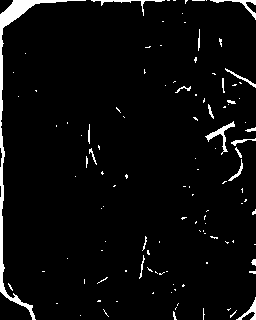

In [ ]:
process_images("/content", "/content/mask", input_size="scale_256", gpu=0)

mask_img = Image.open("/content/mask/mask/test.png")

mask_img

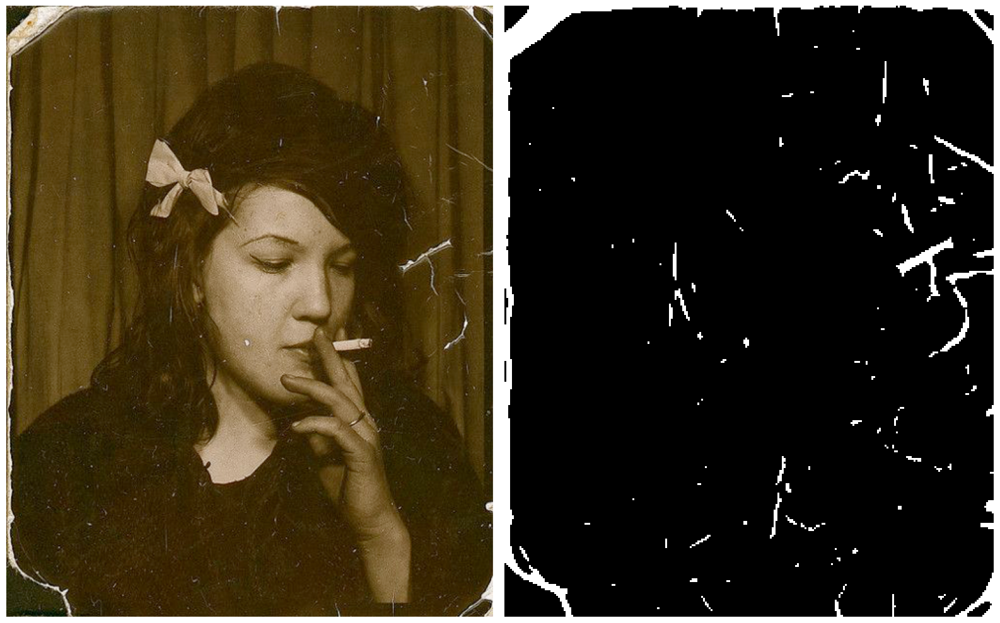

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(16, 10))

axes[0].imshow(img)
axes[1].imshow(mask_img)
axes[0].axis("off")
axes[1].axis("off")
plt.tight_layout()
plt.show()

## Dilated the mask image

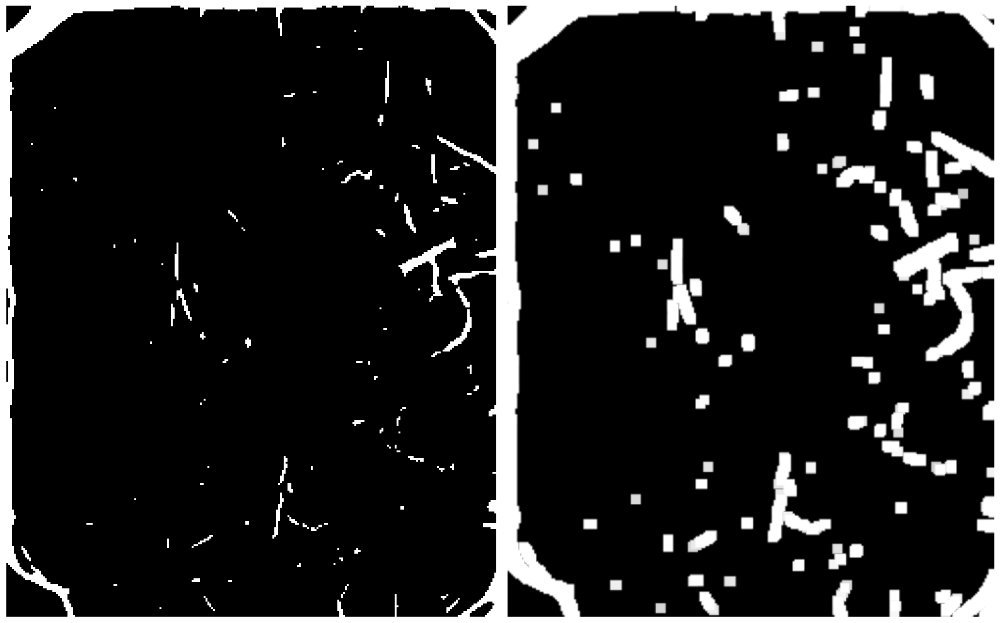

In [ ]:
mask_img_resized = mask_img.resize(img.size, Image.BICUBIC)

# Apply dilation to make the lines bigger
kernel = np.ones((5, 5), np.uint8)
mask_img_np = np.array(mask_img_resized)
mask_img_np_dilated = cv2.dilate(mask_img_np, kernel, iterations=2)
mask_img_dilated = Image.fromarray(mask_img_np_dilated)

fig, axes = plt.subplots(1, 2, figsize=(16, 10))

axes[0].imshow(mask_img)
axes[1].imshow(mask_img_dilated)
axes[0].axis("off")
axes[1].axis("off")
plt.tight_layout()
plt.show()

## Canny edge detection from the image

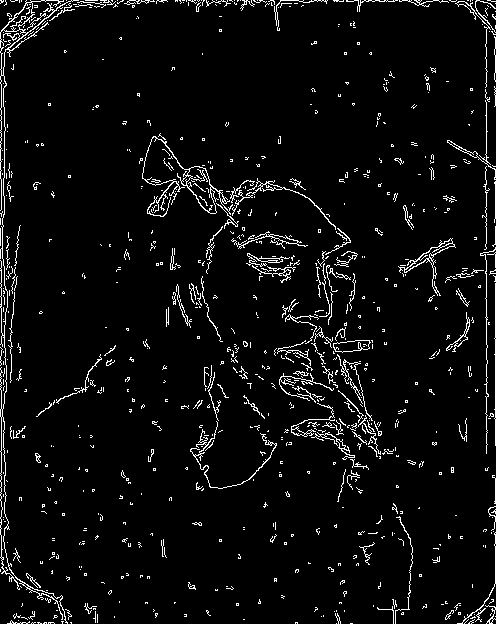

In [ ]:
input_img = np.array(img)

low_threshold = 100
high_threshold = 200
canny = cv2.Canny(input_img, low_threshold, high_threshold)
canny = canny[:, :, None]
canny = np.concatenate([canny, canny, canny], axis=2)
canny_img = Image.fromarray(canny)

canny_img

## Inpaint with Stable Diffusion ControlNet

  0%|          | 0/100 [00:00<?, ?it/s]

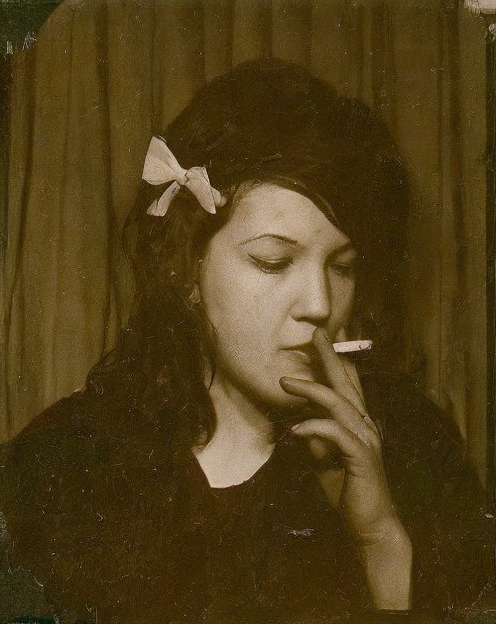

In [ ]:
output = pipe(
    prompt="",
    num_inference_steps=100,
    generator=torch.manual_seed(0),
    image=input_img,
    control_image=canny_img,
    controlnet_conditioning_scale=0,
    mask_image=mask_img_dilated,
).images[0]

output

## Result

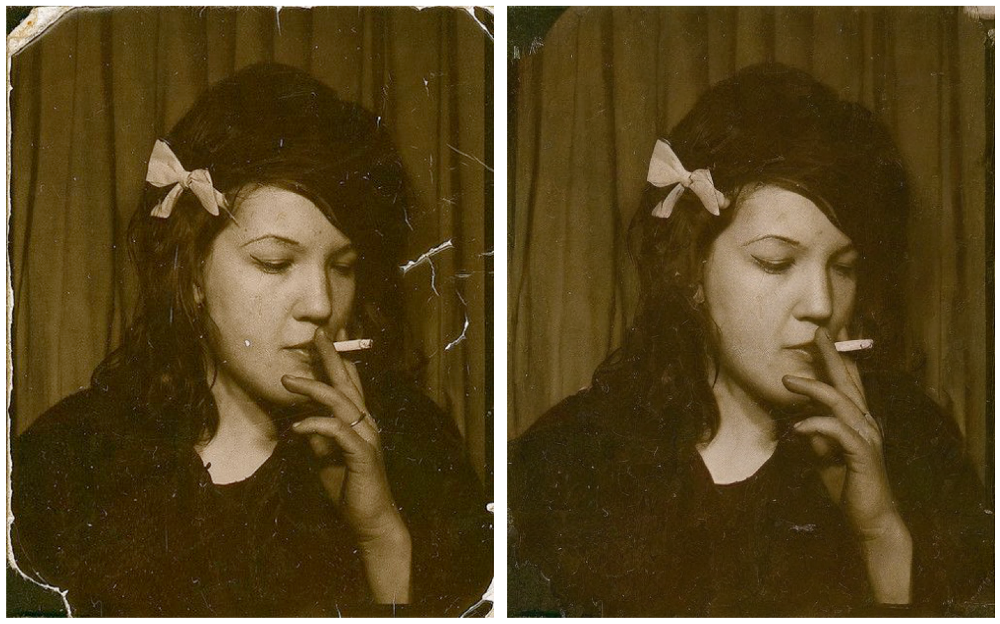

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 10))

axes[0].imshow(img)
axes[1].imshow(output)
axes[0].axis("off")
axes[1].axis("off")
plt.tight_layout()
plt.show()

# Video

In [ ]:
#@title Mount Google Drive

from google.colab import drive
drive.mount('/content/drive')

os.makedirs("/content/drive/MyDrive/unprompted_control", exist_ok=True)

Mounted at /content/drive


In [ ]:
#@title Extract Frames from a Video

os.makedirs("/content/original", exist_ok=True)

cap = cv2.VideoCapture("/content/drive/MyDrive/unprompted_control/old_flim2.mp4")

i = 0

while cap.isOpened():
    ret, img = cap.read()
    if not ret:
        break

    img = Image.fromarray(img[:, :, ::-1])

    img.save(f"/content/original/{str(i).zfill(5)}.png")

    i += 1

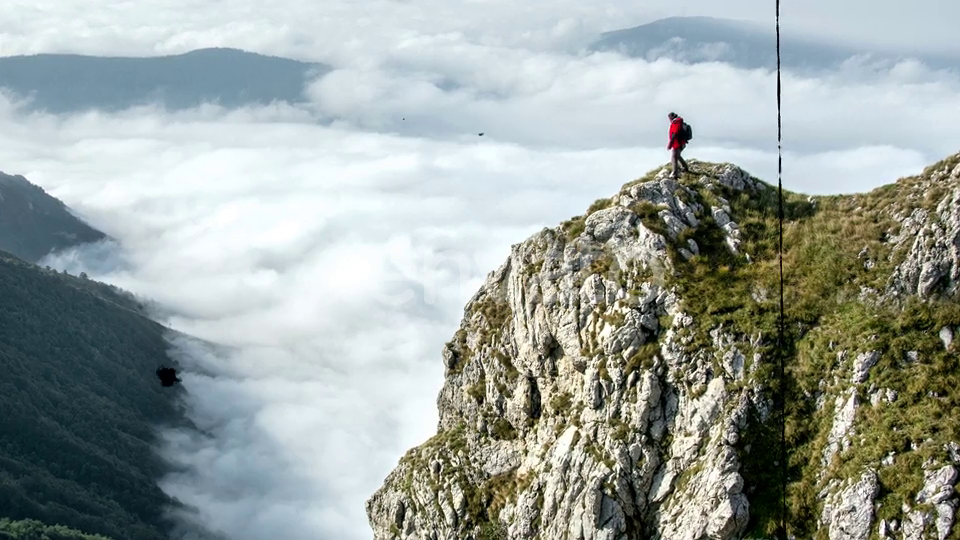

In [ ]:
#@title Test

img_name = "00005.png"

img = Image.open(f"/content/original/{img_name}")

img

In [ ]:
process_images("/content/original", "/content/mask", input_size="scale_256", gpu=0)

initializing the dataloader
model weights loaded
directory of testing image: /content/original
processing 00000.png
processing 00001.png
processing 00002.png
processing 00003.png
processing 00004.png
processing 00005.png
processing 00006.png
processing 00007.png
processing 00008.png
processing 00009.png
processing 00010.png
processing 00011.png
processing 00012.png
processing 00013.png
processing 00014.png
processing 00015.png
processing 00016.png
processing 00017.png
processing 00018.png
processing 00019.png
processing 00020.png
processing 00021.png
processing 00022.png
processing 00023.png
processing 00024.png
processing 00025.png
processing 00026.png
processing 00027.png
processing 00028.png
processing 00029.png
processing 00030.png
processing 00031.png
processing 00032.png
processing 00033.png
processing 00034.png
processing 00035.png
processing 00036.png
processing 00037.png
processing 00038.png
processing 00039.png
processing 00040.png
processing 00041.png
processing 00042.png
pr

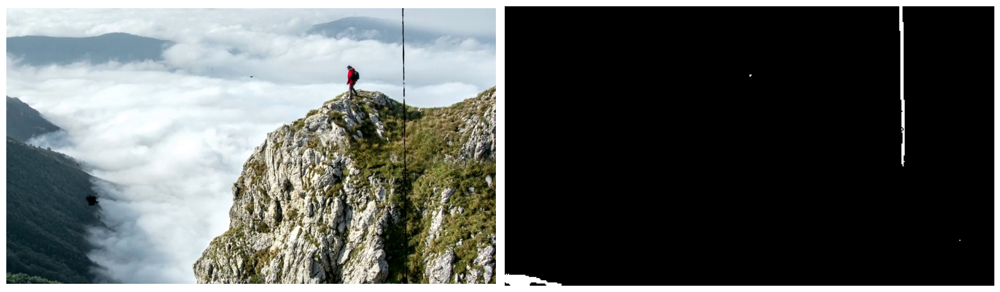

In [ ]:
import matplotlib.pyplot as plt

mask_img = Image.open(f"/content/mask/mask/{img_name}")

fig, axes = plt.subplots(1, 2, figsize=(16, 10))

axes[0].imshow(img)
axes[1].imshow(mask_img)
axes[0].axis("off")
axes[1].axis("off")
plt.tight_layout()
plt.show()

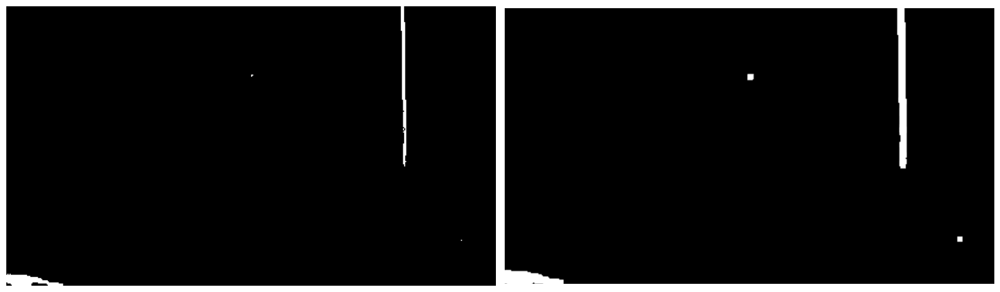

In [ ]:
mask_img_resized = mask_img.resize(img.size, Image.BICUBIC)

# Apply dilation to make the lines bigger
kernel = np.ones((5, 5), np.uint8)
mask_img_np = np.array(mask_img_resized)
mask_img_np_dilated = cv2.dilate(mask_img_np, kernel, iterations=2)
mask_img_dilated = Image.fromarray(mask_img_np_dilated)

fig, axes = plt.subplots(1, 2, figsize=(16, 10))

axes[0].imshow(mask_img)
axes[1].imshow(mask_img_dilated)
axes[0].axis("off")
axes[1].axis("off")
plt.tight_layout()
plt.show()

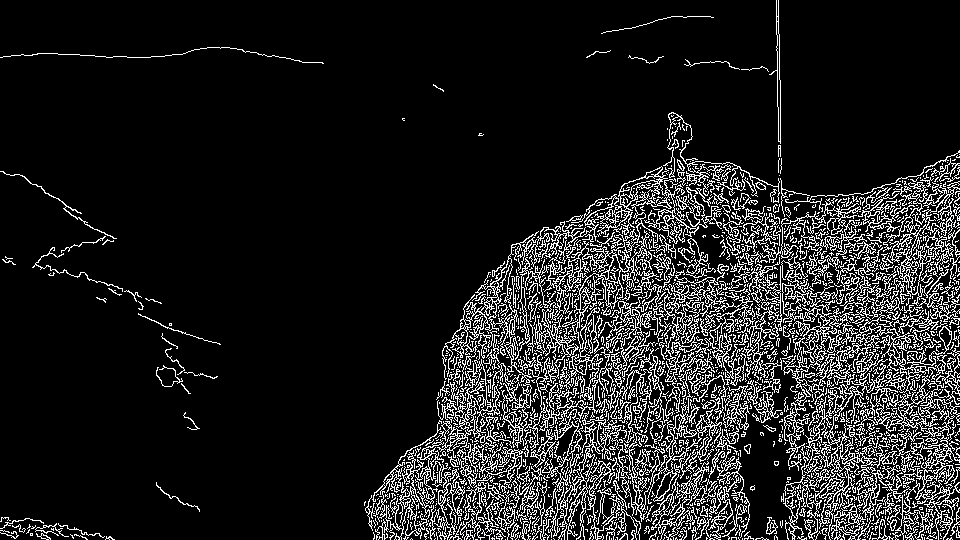

In [ ]:
input_img = np.array(img)

low_threshold = 100
high_threshold = 200
canny = cv2.Canny(input_img, low_threshold, high_threshold)
canny = canny[:, :, None]
canny = np.concatenate([canny, canny, canny], axis=2)
canny_img = Image.fromarray(canny)

canny_img

  0%|          | 0/20 [00:00<?, ?it/s]

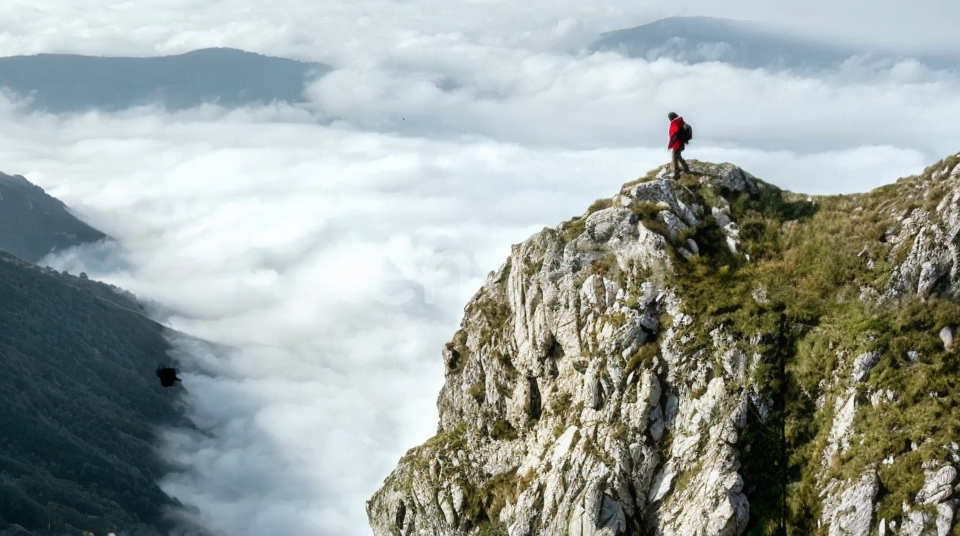

In [ ]:
output = pipe(
    prompt="",
    num_inference_steps=20,
    generator=torch.manual_seed(0),
    image=input_img,
    control_image=canny_img,
    controlnet_conditioning_scale=0,
    mask_image=mask_img_dilated,
).images[0]

output

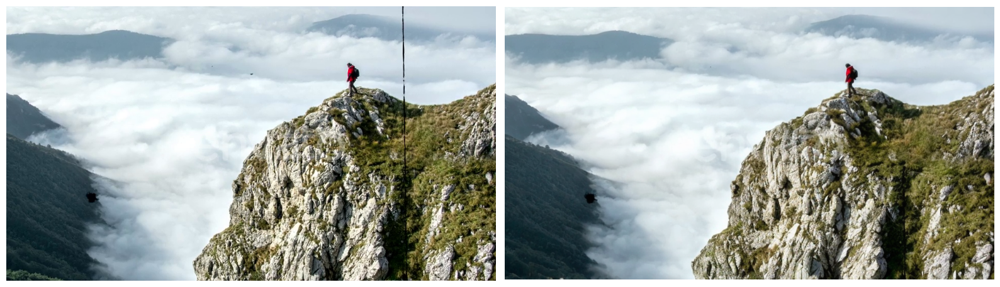

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 10))

axes[0].imshow(img)
axes[1].imshow(output)
axes[0].axis("off")
axes[1].axis("off")
plt.tight_layout()
plt.show()
fig.savefig("/content/result.png", dpi=1200)

In [ ]:
from glob import glob

img_list = sorted(glob("/content/original/*.png"))
mask_list = sorted(glob("/content/mask/mask/*.png"))

len(img_list), len(mask_list)

(65, 65)

In [ ]:
from tqdm import tqdm

os.makedirs("/content/output", exist_ok=True)

low_threshold = 100
high_threshold = 200

for i, (img_path, mask_path) in enumerate(tqdm(zip(img_list, mask_list))):
    img = Image.open(img_path)
    mask_img = Image.open(mask_path)

    mask_img_resized = mask_img.resize(img.size, Image.BICUBIC)

    # Apply dilation to make the lines bigger
    kernel = np.ones((5, 5), np.uint8)
    mask_img_np = np.array(mask_img_resized)
    mask_img_np_dilated = cv2.dilate(mask_img_np, kernel, iterations=2)
    mask_img_dilated = Image.fromarray(mask_img_np_dilated)

    input_img = np.array(img)

    canny = cv2.Canny(input_img, low_threshold, high_threshold)
    canny = canny[:, :, None]
    canny = np.concatenate([canny, canny, canny], axis=2)
    canny_img = Image.fromarray(canny)

    output = pipe(
        prompt="",
        num_inference_steps=20,
        generator=torch.manual_seed(0),
        image=input_img,
        control_image=canny_img,
        controlnet_conditioning_scale=0,
        mask_image=mask_img_dilated,
    ).images[0]

    output.save(f"/content/output/{str(i).zfill(5)}.png")

    i += 1

0it [00:00, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

1it [00:10, 10.58s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

2it [00:21, 10.76s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

3it [00:32, 10.83s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

4it [00:42, 10.72s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

5it [00:53, 10.55s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

6it [01:03, 10.39s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

7it [01:13, 10.26s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

8it [01:23, 10.16s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

9it [01:33, 10.15s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

10it [01:43, 10.21s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

11it [01:54, 10.28s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

12it [02:04, 10.35s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

13it [02:15, 10.37s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

14it [02:25, 10.31s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

15it [02:35, 10.26s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

16it [02:45, 10.20s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

17it [02:55, 10.15s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

18it [03:05, 10.16s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

19it [03:15, 10.20s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

20it [03:26, 10.24s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

21it [03:36, 10.29s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

22it [03:46, 10.31s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

23it [03:57, 10.30s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

24it [04:07, 10.27s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

25it [04:17, 10.23s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

26it [04:27, 10.23s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

27it [04:38, 10.24s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

28it [04:48, 10.24s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

29it [04:58, 10.26s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

30it [05:09, 10.30s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

31it [05:19, 10.29s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

32it [05:29, 10.27s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

33it [05:39, 10.31s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

34it [05:50, 10.49s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

35it [06:01, 10.45s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

36it [06:12, 10.62s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

37it [06:23, 10.77s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

38it [06:33, 10.66s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

39it [06:44, 10.57s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

40it [06:54, 10.48s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

41it [07:04, 10.41s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

42it [07:14, 10.35s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

43it [07:25, 10.31s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

44it [07:35, 10.29s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

45it [07:45, 10.26s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

46it [07:57, 10.69s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

47it [08:08, 10.78s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

48it [08:18, 10.63s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

49it [08:28, 10.55s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

50it [08:39, 10.48s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

51it [08:49, 10.40s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

52it [08:59, 10.34s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

53it [09:09, 10.30s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

54it [09:19, 10.26s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

55it [09:30, 10.27s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

56it [09:40, 10.29s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

57it [09:50, 10.31s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

58it [10:01, 10.33s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

59it [10:11, 10.32s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

60it [10:21, 10.30s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

61it [10:31, 10.25s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

62it [10:42, 10.22s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

63it [10:52, 10.24s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

64it [11:02, 10.28s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

65it [11:13, 10.36s/it]


In [ ]:
from glob import glob

img_list = sorted(glob("/content/output/*.png"))

len(img_list)

65

In [ ]:
height, width, _ = cv2.imread(img_list[0]).shape
FPS = 30

fourcc = cv2.VideoWriter_fourcc('m', 'p', '4', 'v')
out = cv2.VideoWriter('/content/output.mp4', fourcc, FPS, (width, height))

for img_path in img_list:
    out.write(cv2.imread(img_path))

out.release()